## Sparse Principal Component Analysis (SPCA)

> Sparse PCA is a dimensionality reduction technique similar to PCA. It obtains a new set of feature vectors in which, rather than being a linear combination of all original features with small coefficients, only a subset of $k$ features are utilized (non-zero coefficients). This means the loadings from PCA will be mostly $0$s, or _sparse_.

Sparse PCA is useful when there are many feature inputs and you would like to obtain a smaller, more interpretable, set of features for greater explainability. Because less of the data is used in translating to this new feature space, this method is valuable when you know your data is sparse. The code in this notebook will offer a visual intuition behind the value of the algorithm along with some general PCA intuition when applied to imagery. 

This notebook will depart from the approach in the [notebook on PCA](../linearPCA/pca_oscillatory_system.ipynb) and the [notebook on Kernel PCA](../kernelPCA/kernel_pca.ipynb) in that it will not provide a sketch of the mathematics involved in solving the problem. This is because the task of obtaining sparse features is a non-convex optimization problem, and several algorithms have been developed to approximate the solution. Instead, we favor an applied approach to understanding the utility of Sparse PCA and make use of a built-in implementation provided by _scikit-learn_. If curious, please see _Sparse Principal Component Analysis_ (2006) by Zou, Hastie, and Tibshirani for one (of several) approaches to the problem. The link is provided below under __References__.

<u>__Problem Statement__<u>

Assume we have a mean-centered data matrix $X \in R^{n \times d}$, with $n$ samples and $d$ features. We wish to find principal components that make use of at most $k$ of the original $d$ features. Generally, we take $k << d$. This will help to provide interpretability to datasets that have a significant number of starting features. It will also help pick out those features that are most important to describing the data. The problem can be phrased as follows: Let $$C = \frac{1}{n-1}X^TX$$ which is the sample covariance matrix. Find vectors $\vec{v}$ such that the quantity $$\vec{v}^TC\vec{v}$$ is maximal, providing we have $$||\vec{v}||_2 = 1 \;\;\;\text{and}\;\;\; ||\vec{v}||_0 \leq k$$

Note the quantity to maximize represents the variance of the data captured along that specific vector $\vec{v}$. This phrasing is identical to that of PCA when $k = d$. Recall with PCA that the goal was to find eigenvectors and eigenvalues of the covariance amtrix $C$, so that $$CV = V\Lambda$$ where $\Lambda$ represents the variance along that principal direction. This equation is equivalent to $$\Lambda = V^TCV$$ or, for a specific column of $V$, $$\vec{v_i}^TC\vec{v_i} = \lambda_i$$

<u>__Application__<u>

We will work with the well-known Modified National Institute of Standards and Technology (MNIST) handwritten digits, which contains $60,000$ $28 \times 28$ training images of grayscale (single-band) handwritten digits. The images are of type $uint8$ and normalized from $0$ to $255$. We will use the dataset provided by the _TensorFlow_ package in Python.

In [31]:
# Imports
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA, SparsePCA
import tensorflow as tf
import tensorflow.keras.datasets as tfds
import matplotlib.pyplot as plt
import plotly.express as px
import matplotlib as mpl
import seaborn as sns

Data array has shape:  (60000, 28, 28)
Data is type:  uint8
Data max:  255
Data min:  0
The labels are:  [0 1 2 3 4 5 6 7 8 9]


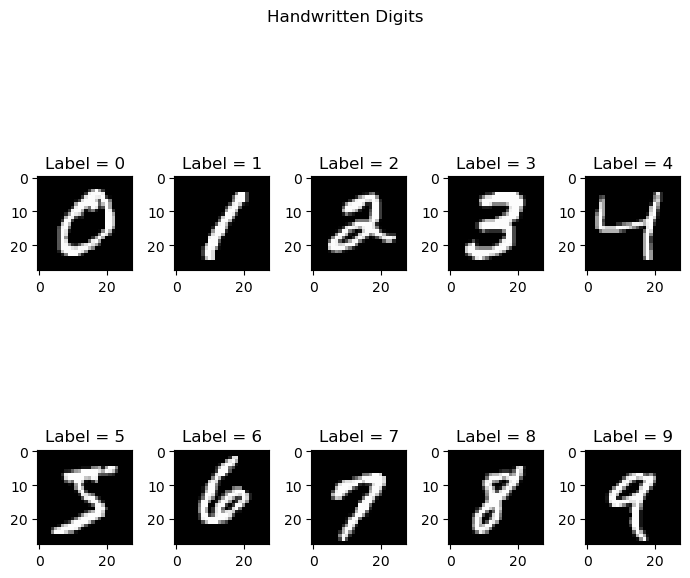

In [32]:
(x_train, y_train), (_, _) = tfds.mnist.load_data()
print('Data array has shape: ', x_train.shape)
print('Data is type: ', x_train.dtype)
print('Data max: ', x_train.max())
print('Data min: ', x_train.min())
print('The labels are: ', np.unique(y_train))

fig, axs = plt.subplots(2, 5, figsize=(7, 7))
axs = axs.flatten()
plt.suptitle('Handwritten Digits')
for label, ax in zip(np.unique(y_train), axs):
    ix = np.where(y_train == label)[0][0]
    ax.set_title(f'Label = {label}')
    ax.imshow(x_train[ix], cmap = 'gray')
fig.tight_layout()
plt.show()

Let's apply linear PCA to this data, and reduce it down to 3 dimensions. First, we must reshape our data array to a matrix of shape $(60000, 28*28) = (60000, 784)$.

In [33]:
X = x_train.reshape(-1, 784)
X_c = X - np.mean(X, axis = 0)

In [34]:
pca_3d = PCA(n_components=3)
X_pca_3d = pca_3d.fit_transform(X_c)

pca_df = pd.DataFrame({'pca_1': X_pca_3d[:,0],
                       'pca_2':X_pca_3d[:,1],
                       'pca_3':X_pca_3d[:,2],
                       'label': y_train})

fig = px.scatter_3d(pca_df,
                    x = 'pca_1',
                    y = 'pca_2',
                    z = 'pca_3',
                    title = f'First three Principal Components.',
                    color = 'label',
                    height = 500,
                    width = 500)

fig.show()

Now that we've viewed it in $3D$, let's view it in $2D$ for good measure.

In [35]:
fig = px.scatter(pca_df,
                 x = 'pca_1',
                 y = 'pca_2',
                 color = 'label',
                 title = f'First two Principal Components.',
                 height = 500,
                 width = 500)

fig.show()

If your goal is classification, you could try Kernel PCA on this data since there appears to be non-linear relationships among the features. This notebook is not focused on classification however, so we wil not perform KPCA here. If interested, please see the notebook on Kernel PCA linked above, or _scikit-learn_'s implementation. Note there are $n = 60,000$ samples and KPCA scales with $n$, so it may be worth taking a representative sample of the training data before applying KPCA.

Let's visualize the principal direction entries for the first three principal components. Remember, each original feature is a pixel in a $28 \times 28$ grid of pixels. We will view them as a heatmap with black representing features with a coefficient of zero, and non-zero values on a green color scale.

In [36]:
# Set the colormap and masked pixel color as black.
cmap = mpl.colormaps.get_cmap('Greens')
cmap.set_bad("k")

<Axes: title={'center': 'Third Principal Axis'}>

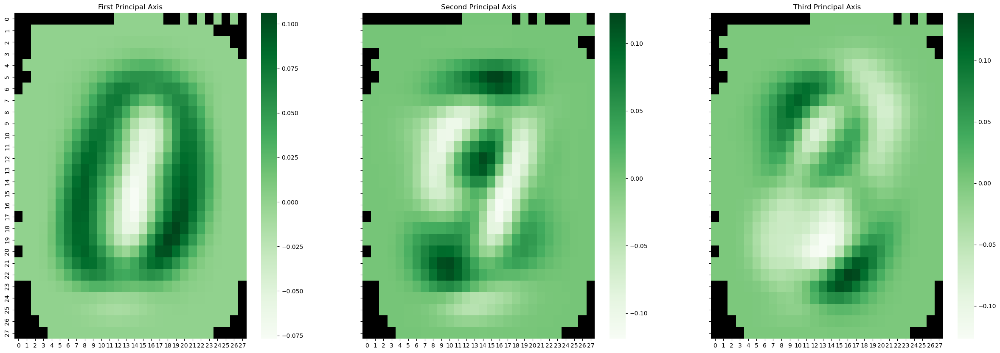

In [37]:
principal_axes = pca_3d.components_
pa1_img = principal_axes[0].reshape((28, 28))
pa2_img = principal_axes[1].reshape((28, 28))
pa3_img = principal_axes[2].reshape((28, 28))

fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize = (30,10), sharey = True)

pa1_zero_mask = np.zeros(pa1_img.shape)
pa1_zero_mask[pa1_img == 0] = 1
ax1.set_title('First Principal Axis')
sns.heatmap(pa1_img, mask = pa1_zero_mask, cmap = cmap, ax = ax1, cbar = True)

pa2_zero_mask = np.zeros(pa2_img.shape)
pa2_zero_mask[pa2_img == 0] = 1
ax2.set_title('Second Principal Axis')
sns.heatmap(pa2_img, mask = pa2_zero_mask, cmap = cmap, ax = ax2, cbar = True)

pa3_zero_mask = np.zeros(pa3_img.shape)
pa3_zero_mask[pa3_img == 0] = 1
ax3.set_title('Third Principal Axis')
sns.heatmap(pa3_img, mask = pa3_zero_mask, cmap = cmap, ax = ax3, cbar = True)

The above plots demonstrate which spatial features contribute most to each of the top three principal components. Note how the borders generally take a value extremly close to $0$, but few are actually equal to zero (black pixels are zeros). Those pixels are largely irrelevant in the dataset and can safely be discarded. This falls in line with the goals of SPCA.

Before applying SPCA, let's calculate the proportion of zero entries in each of these vectors provided by PCA.

In [38]:
print('Percentage of total pixels zero: ', np.mean(principal_axes == 0))
for i in range(len(principal_axes)):
    sparsity_perc = len(np.where(principal_axes[i] == 0)[0])/len(principal_axes[i])
    print(f'Principal Axis {i+1} sparsity: ', sparsity_perc)

Percentage of total pixels zero:  0.06887755102040816
Principal Axis 1 sparsity:  0.07525510204081633
Principal Axis 2 sparsity:  0.06505102040816327
Principal Axis 3 sparsity:  0.0663265306122449


Almost 7% of the data is made up of zeros. Now we perform SPCA and compare.

In [39]:
spca = SparsePCA(n_components = 3,
                 alpha = 10,
                 max_iter = 2000)

X_spca = spca.fit_transform(X_c) #shape (60000, n_components)
principal_axes_sparse = spca.components_ #shape (n_components, 784)

print('Percentage of pixels zero: ', np.mean(principal_axes_sparse == 0))
for i in range(len(principal_axes_sparse)):
    sparsity_perc = len(np.where(principal_axes_sparse[i] == 0)[0])/len(principal_axes_sparse[i])
    print(f'Principal Axis {i+1} sparsity: ', sparsity_perc)

Percentage of pixels zero:  0.2576530612244898
Principal Axis 1 sparsity:  0.288265306122449
Principal Axis 2 sparsity:  0.23469387755102042
Principal Axis 3 sparsity:  0.25


We have increased the sparsity in our principal directions from 7% to approximately 25%. Let's visualize.

<Axes: >

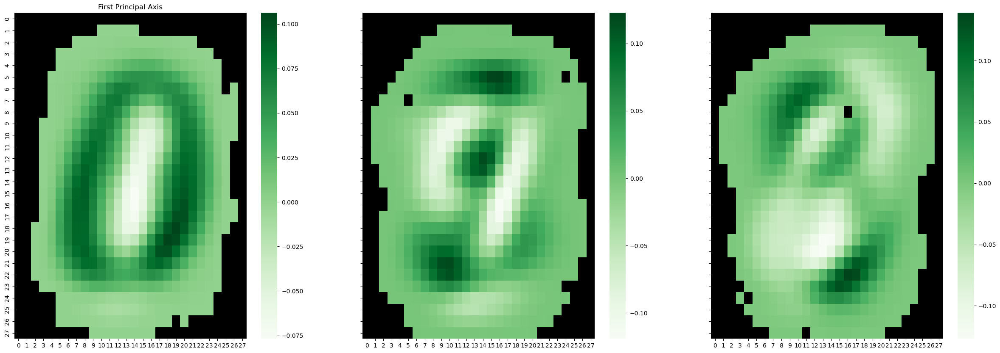

In [40]:
fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize = (30,10), sharey = True)

spa1_img = principal_axes_sparse[0].reshape((28, 28))
spa2_img = principal_axes_sparse[1].reshape((28, 28))
spa3_img = principal_axes_sparse[2].reshape((28, 28))

spa1_zero_mask = np.zeros(spa1_img.shape)
spa1_zero_mask[spa1_img == 0] = 1
ax1.set_title('First Principal Axis')
sns.heatmap(spa1_img, mask = spa1_zero_mask, cmap = cmap, ax = ax1, cbar = True)

spa2_zero_mask = np.zeros(spa2_img.shape)
spa2_zero_mask[spa2_img == 0] = 1
ax1.set_title('First Principal Axis')
sns.heatmap(spa2_img, mask = spa2_zero_mask, cmap = cmap, ax = ax2, cbar = True)

spa3_zero_mask = np.zeros(spa3_img.shape)
spa3_zero_mask[spa3_img == 0] = 1
ax1.set_title('First Principal Axis')
sns.heatmap(spa3_img, mask = spa3_zero_mask, cmap = cmap, ax = ax3, cbar = True)

Note the increase in zero valued pixels.

In other applications, SPCA can have benefits besides removing superfluous features. Imagine a setting where featuers aren't pixels, but represent a more interpretable quantity such as weight, distance, age, etc... In these cases, it can be invaluable to provide interpretability to new features, such as being able to say "PC1 is 10% age, 30% gender, etc. One downside is that the algorithm can be time consuming.

Before finishing up the notebook, we will look at a data point projected onto a variable number of PCA axes. This demonstrates how we might visually interpret the heatmaps above. Consider a random 2 for example.

In [41]:
# Fit a new PCA object with more components to play with.
pca = PCA(n_components = 100)
X_pca = pca.fit_transform(X_c)

exp_vars = pca.explained_variance_
principal_axes = pca.components_

# Plot the variances.
fig = px.scatter(x = range(1, len(exp_vars) + 1),
                 y = exp_vars,
                 title = 'Explained Variances')
fig.show() 

According to the above plot, 60 components should be plenty to recapure the vast majority of the original image.

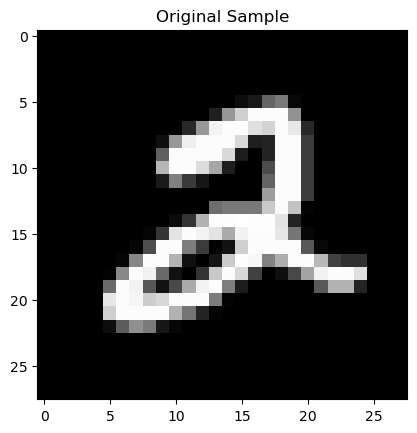

In [42]:
label = 2 # The digit to disply, taken from the dataset.

ix = np.where(y_train == label)[0][0] # This chooses the first occurrence; feel free to change the second 0.
sample = x_train[ix]
plt.title('Original Sample')
plt.imshow(sample, cmap= 'gray')
pca_coords = X_pca[ix]

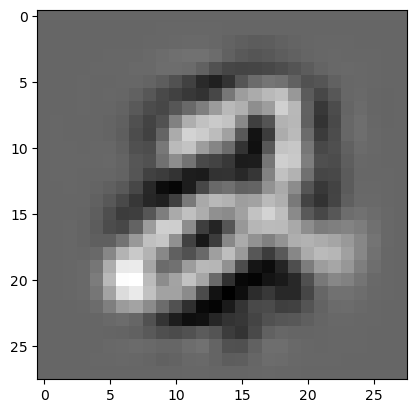

In [43]:
num_components = 75 #How many principal components. More means better approximation.

pca_recreation = np.zeros((28,28))
for i in range(num_components):
    pca_recreation += pca_coords[i]*principal_axes[i].reshape((28, 28))

plt.imshow(pca_recreation, cmap= 'gray')

We see the 'two' start to take shape, especially after 75 components. Feel free to experiment with the above code.

Note the above result is the best rank $r$ approximation of the image, where $r$ is the number of principal components of the PCA analysis. Euivalently,$r$ is the number of right singular vectors utuilized in a low-rank __SVD__ approximation of the data matrix $X$.

I hope this notebook was interesting. Thank you for reading.

<u>__References__<u>

Hui Zou; Trevor Hastie; Robert Tibshirani (2006). "Sparse principal component analysis". https://faculty.cc.gatech.edu/~isbell/reading/papers/sparsepc.pdf